# What sells a car?

It's very interesting being an analyst at Crankshaft List. <br>
Hundreds of free advertisements for vehicles are published on the site every day.<br>
Let's study data collected over the last few years and determine which factors influence the price of a vehicle.
* Based on the data received from our vehicles ads database, let's try to find out what factors influence the most the prices at the time to sell a car. 

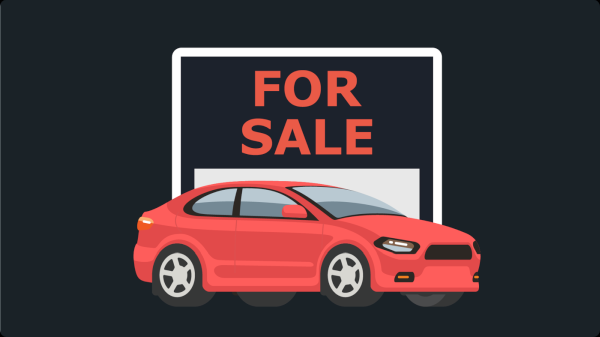
<hr>


## Table of Contents

* General information
    * First Impressions



    
*  Data Preprocessing
    * Treating missing values
    * Potential Duplicates
    * Fixing data types
    * Enrich data



* Exploratory data analysis
    * Study and treat outliers
    * Study core parameters without outliers
    * Ads lifetime


* Average price per each type of vehicle
    * Top Car types
    * Price factors influences(Sedan and SUV)
 
 
    
* General Conclusions
   



<hr>


# Step 1. General information

## Initialization

In [1]:
#pip install pandas-profiling


In [2]:
# Loading all the libraries
import pandas as pd
import plotly.express as px
from pandas.plotting import scatter_matrix
import matplotlib
from matplotlib import pyplot as plt
import datetime
import numpy as np
%matplotlib inline
import statistics as st
import seaborn as sns


### Load data

In [3]:
# Load the data file into a DataFrame

try:
    auto = pd.read_csv('/datasets/vehicles_us.csv')
except:
    auto = pd.read_csv('https://code.s3.yandex.net/datasets/vehicles_us.csv')


<hr>

### Explore initial data

The dataset contains the following fields:
- `price`
- `model_year`
- `model`
- `condition`
- `cylinders`
- `fuel` — gas, diesel, etc.
- `odometer` — the vehicle's mileage when the ad was published
- `transmission`
- `paint_color`
- `is_4wd` — whether the vehicle has 4-wheel drive (Boolean type)
- `date_posted` — the date the ad was published
- `days_listed` — from publication to removal

#### Understanding the fields

In [4]:
auto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


In [5]:
# looking at a sample of data

auto.head(20)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28
5,14990,2014.0,chrysler 300,excellent,6.0,gas,57954.0,automatic,sedan,black,1.0,2018-06-20,15
6,12990,2015.0,toyota camry,excellent,4.0,gas,79212.0,automatic,sedan,white,NaN,2018-12-27,73
7,15990,2013.0,honda pilot,excellent,6.0,gas,109473.0,automatic,SUV,black,1.0,2019-01-07,68
8,11500,2012.0,kia sorento,excellent,4.0,gas,104174.0,automatic,SUV,NaN,1.0,2018-07-16,19
9,9200,2008.0,honda pilot,excellent,NaN,gas,147191.0,automatic,SUV,blue,1.0,2019-02-15,17


In [6]:
# print the general/summary information about the DataFrame
auto.describe().T


,count,mean,std,min,25%,50%,75%,max
price,51525.0,12132.464920,10040.803015,1.0,5000.0,9000.0,16839.0,375000.0
model_year,47906.0,2009.750470,6.282065,1908.0,2006.0,2011.0,2014.0,2019.0
cylinders,46265.0,6.125235,1.660360,3.0,4.0,6.0,8.0,12.0
odometer,43633.0,115553.461738,65094.611341,0.0,70000.0,113000.0,155000.0,990000.0
is_4wd,25572.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
days_listed,51525.0,39.554760,28.204270,0.0,19.0,33.0,53.0,271.0


In [7]:
auto.describe(include = 'object').T

,count,unique,top,freq
model,51525,100,ford f-150,2796
condition,51525,6,excellent,24773
fuel,51525,5,gas,47288
transmission,51525,3,automatic,46902
type,51525,13,SUV,12405
paint_color,42258,12,white,10029
date_posted,51525,354,2019-03-17,186


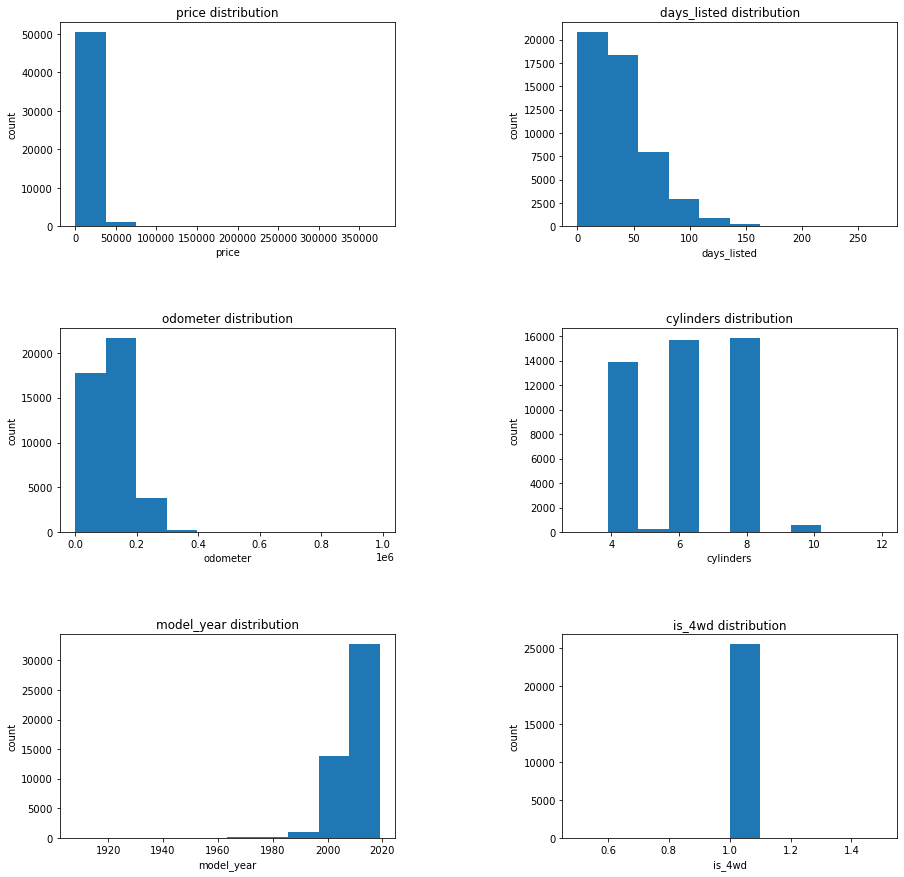

In [8]:
#Histograms for the numerical values

fig = plt.figure(figsize=(15,15))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
for ind, col in enumerate(['price', 'days_listed', 'odometer', 'cylinders' , 'model_year', 'is_4wd']):
    ax = fig.add_subplot(3, 2, ind + 1)
    plt.hist(data=auto, x=col)
    plt.title(col + ' distribution')
    plt.xlabel(col)
    plt.ylabel("count")

# Working Summary



* 0   price         51525 non-null  int64  find outliers and search explanations 
* 1   model_year    47906 non-null  float64 **type-date  
* 2   model         51525 non-null  object **ok**
* 3   condition     51525 non-null  object **create scale_condition with numbers 0-5**
* 4   cylinders     46265 non-null  float64 **Replace null to  mode by model**
* 5   fuel          51525 non-null  object **ok**
* 6   odometer      43633 non-null  float64 **Groupby model_year**
* 7   transmission  51525 non-null  object **ok**
* 8   type          51525 non-null  object **ok**
* 9   paint_color   42258 non-null  object  **Replace null by undef**
* 10  is_4wd        25572 non-null  float64 **Replace null to 0 ?**
* 11  date_posted   51525 non-null  object **datetime to find month and years**
* 12  days_listed   51525 non-null  int64  **ok**
 
 



<hr>


## First Impressions

We received a database with more than 51000 values, but some columns appear to have a large number of missing data.
* Model Year appears with almost 48000 values (~3000 missing Values)
* Cylinders appears with a little bit more than 46000 values (~5000 missing Values)
* Odometer appears with approximatelly 43000 values (~8000 missing Values)
* Paint Color appears with approximatelly 42000 values (~9000 missing Values)
* is_4wd has almost 50% of missing Values (25572), (but probably is because the value is 1 for True and Nan For False)
* The date_posted contains dates, but is formated as sritngs, so we will have to change the type for that column

There are also some outliers in the max and min of the prices, model year , odometer and days listed, that deserve some attention to avoid deviations in our conclusions.

Some columns data could be more usefull if we can change the type like in the condition, that we can create a numeric classification to it instead to look at the excelent, good, fair, etc

date_posted and days listed appears to be in good format to the analysis.

I will check the values in each column with categoric data, only to try to figure out if there is a relevant issue with the entries.




<hr>

### Categorical Values ###

To expand my knowledge about the Data, I will check the values in the string columns

In [9]:
#Checking the unique values of columns to try to find any anomalies
auto['transmission'].unique()

array(['automatic', 'manual', 'other'], dtype=object)

In [10]:
auto['type'].unique()

array(['SUV', 'pickup', 'sedan', 'truck', 'coupe', 'van', 'convertible',
       'hatchback', 'wagon', 'mini-van', 'other', 'offroad', 'bus'],
      dtype=object)

In [11]:
auto['fuel'].unique()

array(['gas', 'diesel', 'other', 'hybrid', 'electric'], dtype=object)

In [12]:
auto['condition'].unique()

array(['good', 'like new', 'fair', 'excellent', 'salvage', 'new'],
      dtype=object)

In [13]:
auto['paint_color'].unique()

array([nan, 'white', 'red', 'black', 'blue', 'grey', 'silver', 'custom',
       'orange', 'yellow', 'brown', 'green', 'purple'], dtype=object)

In [14]:
auto['model'].sort_values().unique()

array(['acura tl', 'bmw x5', 'buick enclave', 'cadillac escalade',
       'chevrolet camaro', 'chevrolet camaro lt coupe 2d',
       'chevrolet colorado', 'chevrolet corvette', 'chevrolet cruze',
       'chevrolet equinox', 'chevrolet impala', 'chevrolet malibu',
       'chevrolet silverado', 'chevrolet silverado 1500',
       'chevrolet silverado 1500 crew', 'chevrolet silverado 2500hd',
       'chevrolet silverado 3500hd', 'chevrolet suburban',
       'chevrolet tahoe', 'chevrolet trailblazer', 'chevrolet traverse',
       'chrysler 200', 'chrysler 300', 'chrysler town & country',
       'dodge charger', 'dodge dakota', 'dodge grand caravan',
       'ford econoline', 'ford edge', 'ford escape', 'ford expedition',
       'ford explorer', 'ford f-150', 'ford f-250', 'ford f-250 sd',
       'ford f-250 super duty', 'ford f-350 sd', 'ford f150',
       'ford f150 supercrew cab xlt', 'ford f250', 'ford f250 super duty',
       'ford f350', 'ford f350 super duty', 'ford focus', 'ford focus

In [15]:

auto['cylinders'].unique()

array([ 6.,  4.,  8., nan,  5., 10.,  3., 12.])

### Intermediate Observations
Aparently the data reflects well the characteristics of a car sale ad.
We have now to deal with the missing values and correct the data type.


<hr>


# Step 2. Data preprocessing



## Treating missing values 

### is_4wd ###


In [16]:
#checking the values of the 4wd column
auto['is_4wd'].unique()

array([ 1., nan])

For the is_4wd, let's replace the nan for the value 0 (If they have 4wd = 1 if not = 0)

In [17]:
auto['is_4wd'].replace(np.nan,0,inplace=True)
auto['is_4wd'].unique()

array([1., 0.])

### paint_color ###
let's replace the nan for the value undef

In [18]:
auto['paint_color'].replace(np.nan,'undef',inplace=True)
auto['paint_color'].value_counts()

white     10029
undef      9267
black      7692
silver     6244
grey       5037
blue       4475
red        4421
green      1396
brown      1223
custom     1153
yellow      255
orange      231
purple      102
Name: paint_color, dtype: int64

### larger missing values ###
The larger missing values are in the odometer and model_year columns.
Let's check if there is a correlation of this null values

### Model_year ###
Let's try to understand how to clean the model_year column

In [19]:
auto['model_year'].describe()

count    47906.000000
mean      2009.750470
std          6.282065
min       1908.000000
25%       2006.000000
50%       2011.000000
75%       2014.000000
max       2019.000000
Name: model_year, dtype: float64

In [20]:

auto.query('model_year<2000').sort_values(['model_year']).head(15)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
33906,12995,1908.0,gmc yukon,good,8.0,gas,169328.0,automatic,SUV,black,0.0,2018-07-06,34
33907,12995,1908.0,cadillac escalade,excellent,8.0,gas,NaN,automatic,SUV,white,0.0,2018-06-24,25
45694,18000,1929.0,ford f-150,good,8.0,gas,NaN,manual,other,silver,0.0,2018-11-18,59
34713,5000,1936.0,ford f-150,excellent,6.0,gas,30000.0,manual,pickup,purple,0.0,2018-11-22,10
22595,21000,1948.0,chevrolet impala,like new,8.0,gas,4000.0,automatic,sedan,red,0.0,2019-01-18,24
36582,44900,1949.0,chevrolet suburban,good,NaN,gas,1800.0,automatic,wagon,orange,0.0,2018-08-19,10
14752,15000,1954.0,ford f-150,excellent,NaN,gas,3565.0,manual,pickup,black,0.0,2019-02-16,13
10018,23900,1955.0,ford f250,excellent,6.0,gas,47180.0,manual,truck,blue,0.0,2018-12-22,61
48414,37900,1958.0,chevrolet impala,good,8.0,gas,62799.0,automatic,coupe,undef,0.0,2018-08-11,10
39580,35000,1958.0,chevrolet impala,excellent,8.0,gas,3184.0,automatic,coupe,black,0.0,2018-05-19,33


For the first outliers from 1908 to 1949, and comparing with the odometer values it seems like they are typo mistakes (instead the years 1980 or 1994)
I will address manualy this changes

In [21]:
auto['model_year'].replace(1908,1980,inplace=True)
auto['model_year'].replace(1929,1992,inplace=True)
auto['model_year'].replace(1936,1963,inplace=True)
auto['model_year'].replace(1948,1984,inplace=True)
auto['model_year'].replace(1949,1994,inplace=True)
auto.query('model_year<2000').sort_values(['model_year']).head(10)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
14752,15000,1954.0,ford f-150,excellent,NaN,gas,3565.0,manual,pickup,black,0.0,2019-02-16,13
10018,23900,1955.0,ford f250,excellent,6.0,gas,47180.0,manual,truck,blue,0.0,2018-12-22,61
39580,35000,1958.0,chevrolet impala,excellent,8.0,gas,3184.0,automatic,coupe,black,0.0,2018-05-19,33
48414,37900,1958.0,chevrolet impala,good,8.0,gas,62799.0,automatic,coupe,undef,0.0,2018-08-11,10
28009,65000,1960.0,chevrolet corvette,like new,8.0,gas,NaN,manual,coupe,undef,0.0,2018-11-03,41
33007,17500,1960.0,chevrolet impala,excellent,8.0,gas,31000.0,automatic,sedan,white,0.0,2019-02-01,11
40089,20000,1960.0,chevrolet impala,excellent,8.0,gas,1000.0,automatic,sedan,custom,0.0,2018-06-30,75
34251,5500,1961.0,chevrolet impala,good,8.0,gas,66000.0,automatic,sedan,red,0.0,2018-10-16,29
21083,20000,1962.0,chevrolet impala,good,6.0,gas,0.0,automatic,sedan,blue,0.0,2019-02-14,57
29769,49750,1962.0,chevrolet corvette,excellent,8.0,gas,72000.0,manual,sedan,white,0.0,2018-08-26,18


Let's substitute the null values, grouping the models **median** to find the model_year



In [22]:
auto.groupby(['model'])['model_year'].median().isnull().sum()

0

In [23]:

auto['model_year'] = auto.groupby(['model'])['model_year']\
.transform(lambda grp: grp.fillna(grp.median()))
auto['model_year'].isnull().sum()

0

### odometer ###
Let's do the same with the odometer, but now based on the model_year


In [24]:
auto['odometer'] = auto.groupby(['model_year'])['odometer']\
.transform(lambda grp: grp.fillna(grp.median()))
auto['odometer'].isnull().sum()

0

In [25]:
auto['odometer'].describe()

count     51525.000000
mean     115197.921164
std       62082.648970
min           0.000000
25%       73500.000000
50%      114072.000000
75%      152862.000000
max      990000.000000
Name: odometer, dtype: float64

### Cylinders ###
Replacing the cylinders  null values - we will use **mode** to avoid create a false number of cylinders 

In [26]:
auto.cylinders.unique()

array([ 6.,  4.,  8., nan,  5., 10.,  3., 12.])

In [27]:
auto['cylinders'] = auto.groupby(['model']) ['cylinders']\
.transform(lambda grp: grp.fillna(grp.mode()[0]))
auto['cylinders'].isnull().sum()

0

In [28]:
auto.cylinders.unique()

array([ 6.,  4.,  8.,  5., 10.,  3., 12.])

In [29]:
#Checkimg if there is some symmetry on the nan values odometer and model_year
check_null = auto[(auto.odometer.isnull()) & (auto.model_year.isnull())] 
len(check_null)

0

There is no more null values for these columns


## Potential Duplicates ## 
When analyzing the Data I noticed that there are some car data that are simmilar with only different date_posted and days_listed.
So I would like to check those values:

In [30]:
auto.duplicated(
    subset = ['model_year','model','condition','cylinders','fuel','odometer', 'transmission' , 'type' ,'paint_color' ,'is_4wd']
).sum()



9509

In [31]:
auto.duplicated(
    subset = ['model_year','model','condition','cylinders','fuel','odometer', 'transmission' , 'type' ,'paint_color' ,'is_4wd']
).sum()/auto.odometer.count()

0.1845511887433285

#### intermediate conclusion ###
There are more than 8400 (about 16%) 0f parcially duplicated values in the data that probably were ads published multiple times, so they have a different date_posted but all other values are the same. Those are a lot of simillar entries but we can not be sure if they are dupicates, or only coincidences. Due the large ammount of Data, we keep it this way by now and continue with our study

### Conclusions and further steps

In this stage we treated the missing values, filling the spaces with the most adequated values (means, mode, etc depending of the column.

We have still to check if the data types are according to each characteristic and also try to find the outliers to get a clean dataframe to be the basis of our exploratory analysis on fator that influenced the price

<hr>


## Fixing data types

In [32]:
auto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    51525 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     51525 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      51525 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   51525 non-null  object 
 10  is_4wd        51525 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


In [33]:
auto['cylinders'] = auto['cylinders'].astype(int)
auto['is_4wd'] = auto['is_4wd'].astype(int)
auto['model_year'] = auto['model_year'].astype(int)
auto["date_posted"] = pd.to_datetime(auto["date_posted"])
auto.head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011,bmw x5,good,6,gas,145000.0,automatic,SUV,undef,1,2018-06-23,19
1,25500,2011,ford f-150,good,6,gas,88705.0,automatic,pickup,white,1,2018-10-19,50
2,5500,2013,hyundai sonata,like new,4,gas,110000.0,automatic,sedan,red,0,2019-02-07,79
3,1500,2003,ford f-150,fair,8,gas,161397.0,automatic,pickup,undef,0,2019-03-22,9
4,14900,2017,chrysler 200,excellent,4,gas,80903.0,automatic,sedan,black,0,2019-04-02,28



## Enrich data

Let's work with the date_posted to divide it in more detailed columns, create a numeric category for the condition, find the age of the car when posted and also the miles per year values.

### Ad year

In [34]:
auto['year']= auto["date_posted"].dt.year
auto["year"].unique()

array([2018, 2019], dtype=int64)

### Ad Month

In [35]:
auto['month']= auto["date_posted"].dt.month
auto["month"].unique()

array([ 6, 10,  2,  3,  4, 12,  1,  7,  9,  5,  8, 11], dtype=int64)

### Ad week day

In [36]:
auto['weekday']= auto["date_posted"].dt.weekday
auto["weekday"].unique()

array([5, 4, 3, 1, 2, 0, 6], dtype=int64)

In [37]:
weekdict= {0:"mon", 1:'tue', 2:'wed', 3:'thu' , 4:'fri' , 5:'sat', 6:'sun'}

auto["weekday"] = auto["weekday"].map(weekdict)
auto["weekday"].unique()

array(['sat', 'fri', 'thu', 'tue', 'wed', 'mon', 'sun'], dtype=object)

### Condition category

In [38]:
# It might help to replace the condition values with something that can be manipulated more easily

condict= {"new" : 5, "like new" : 4, "excellent" : 3 , "good" : 2 , "fair" : 1 , "salvage" : 0}

auto['condition_cat'] = auto['condition'].map(condict)
auto['condition_cat'].unique()

array([2, 4, 1, 3, 0, 5], dtype=int64)

### car age when posted

In [39]:
# Add the vehicle's age when the ad was placed

auto['car_age']=(auto['year']-auto['model_year']).round()
auto['car_age'].unique()

array([ 7,  6, 16,  2,  4,  3, 11,  1, 10,  5,  8,  0,  9, 15, 14, 13, 17,
       12, 53, 24, 18, 19, 26, 22, 38, 20, 23, 44, 21, 25, 33, 42, 31, 43,
       29, 28, 46, 52, 49, 30, 40, 54, 39, 50, 27, 32, 55, 37, 56, 34, 45,
       41, 51, 63, 47, 48, 36, 35, 65, 57, 58, 59, 60], dtype=int64)

In [40]:
auto['car_age'].value_counts( bins=5)

(-0.066, 13.0]    42586
(13.0, 26.0]       8383
(26.0, 39.0]        384
(39.0, 52.0]        128
(52.0, 65.0]         44
Name: car_age, dtype: int64

In [41]:
auto['car_age'].value_counts()


7     4066
6     3948
5     3845
4     3532
8     3396
      ... 
60       2
63       1
43       1
65       1
59       1
Name: car_age, Length: 63, dtype: int64

### Miles per year

In [42]:
def get_avg_mileage(x):
    #x here is a row, so when we are working with x['car_age'] we are actually working with an integer
    if x['car_age'] == 0:
        return x['odometer']
    else:
        return x['odometer'] / x['car_age']

auto['miles_year'] = auto.apply(get_avg_mileage, axis=1)

In [43]:
auto.head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
0,9400,2011,bmw x5,good,6,gas,145000.0,automatic,SUV,undef,1,2018-06-23,19,2018,6,sat,2,7,20714.285714
1,25500,2011,ford f-150,good,6,gas,88705.0,automatic,pickup,white,1,2018-10-19,50,2018,10,fri,2,7,12672.142857
2,5500,2013,hyundai sonata,like new,4,gas,110000.0,automatic,sedan,red,0,2019-02-07,79,2019,2,thu,4,6,18333.333333
3,1500,2003,ford f-150,fair,8,gas,161397.0,automatic,pickup,undef,0,2019-03-22,9,2019,3,fri,1,16,10087.312500
4,14900,2017,chrysler 200,excellent,4,gas,80903.0,automatic,sedan,black,0,2019-04-02,28,2019,4,tue,3,2,40451.500000


### Checking the clean data

In [44]:
# print the general/summary information about the DataFrame

auto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   price          51525 non-null  int64         
 1   model_year     51525 non-null  int32         
 2   model          51525 non-null  object        
 3   condition      51525 non-null  object        
 4   cylinders      51525 non-null  int32         
 5   fuel           51525 non-null  object        
 6   odometer       51525 non-null  float64       
 7   transmission   51525 non-null  object        
 8   type           51525 non-null  object        
 9   paint_color    51525 non-null  object        
 10  is_4wd         51525 non-null  int32         
 11  date_posted    51525 non-null  datetime64[ns]
 12  days_listed    51525 non-null  int64         
 13  year           51525 non-null  int64         
 14  month          51525 non-null  int64         
 15  weekday        5152

In [45]:
# print a sample of auto

auto.sample(7)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
14162,9500,2013,nissan maxima,good,6,gas,55000.0,automatic,sedan,grey,0,2018-06-23,39,2018,6,sat,2,5,11000.000000
4098,13999,2010,ram 1500,good,8,gas,108750.0,automatic,truck,blue,0,2018-09-06,73,2018,9,thu,2,8,13593.750000
2960,4999,2011,nissan murano,excellent,6,gas,123025.0,automatic,SUV,white,0,2019-01-27,43,2019,1,sun,3,8,15378.125000
14454,8200,2013,chevrolet silverado,excellent,6,gas,99840.0,automatic,truck,white,0,2019-02-15,13,2019,2,fri,3,6,16640.000000
30026,6750,2009,ford f350 super duty,fair,10,gas,197393.0,automatic,truck,white,1,2018-12-19,111,2018,12,wed,1,9,21932.555556
41270,14998,2014,chrysler 300,excellent,8,gas,89000.0,automatic,sedan,grey,1,2018-07-18,3,2018,7,wed,3,4,22250.000000
27284,38000,2015,ram 3500,good,6,diesel,49000.0,automatic,pickup,white,1,2018-11-29,15,2018,11,thu,2,3,16333.333333


## Study core parameters

Now is the time to work on the outliers and histograms for the values for the following parameters:

- Price
- The vehicle's age when the ad was placed
- Mileage
- Number of cylinders
- Condition

<hr>


# Step 3. Exploratory data analysis

In [46]:
# Let's create a function to explore the data in diverse columns

def explore_raw(df,column):
    print("")
    df.hist(column, figsize=(5,5))
    plt.xlabel(column)
    plt.ylabel("count")
    print(column)
    print("")
    print(df[column].describe())
    print("")
    plt.show()
    print("")




days_listed

count    51525.00000
mean        39.55476
std         28.20427
min          0.00000
25%         19.00000
50%         33.00000
75%         53.00000
max        271.00000
Name: days_listed, dtype: float64



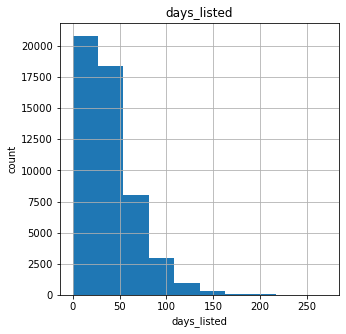

In [47]:
#testing the function explore_raw

explore_raw(auto, 'days_listed')

In [48]:
def find_borders (df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    min_iqr=Q1-1.5*IQR
    max_iqr=Q3+1.5*IQR
    print('min border:',min_iqr)
    print('max border:',max_iqr)

In [49]:
#testing the function find_borders
find_borders(auto,'price')

min border: -12758.5
max border: 34597.5



price

count     51525.000000
mean      12132.464920
std       10040.803015
min           1.000000
25%        5000.000000
50%        9000.000000
75%       16839.000000
max      375000.000000
Name: price, dtype: float64



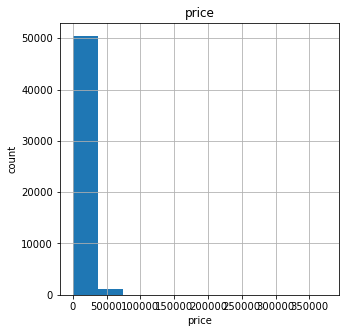



car_age

count    51525.000000
mean         8.507792
std          6.057327
min          0.000000
25%          4.000000
50%          8.000000
75%         12.000000
max         65.000000
Name: car_age, dtype: float64



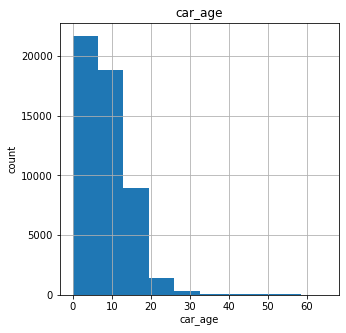



odometer

count     51525.000000
mean     115197.921164
std       62082.648970
min           0.000000
25%       73500.000000
50%      114072.000000
75%      152862.000000
max      990000.000000
Name: odometer, dtype: float64



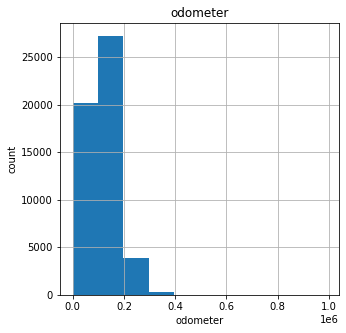



cylinders

count    51525.000000
mean         6.121494
std          1.657296
min          3.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         12.000000
Name: cylinders, dtype: float64



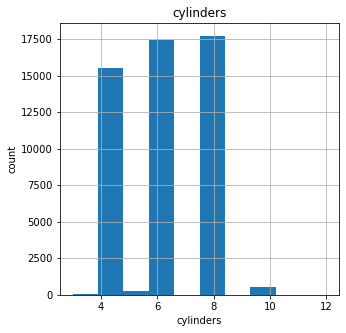



condition_cat

count    51525.000000
mean         2.637535
std          0.712447
min          0.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: condition_cat, dtype: float64



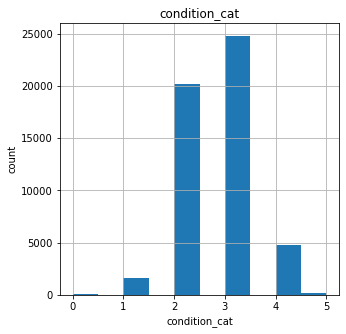

In [50]:
# create a list of columns to be analyzed

list_col=['price', 'car_age', 'odometer', 'cylinders' , 'condition_cat']
for c in list_col:
    explore_raw(auto, c)

<hr>


## Study and treat outliers


In [51]:
#function to check outliers and borders for the numerical columns
def out_check(df,col):
    print(col)
    print()
    print(df[col].describe())
    print('number of null values:', len(df[df[col].isnull()]))
    fig = px.box(df, x=col, width=700, height=400)
    fig.show()
    
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    min_iqr=Q1-1.5*IQR
    max_iqr=Q3+1.5*IQR
    print()
    print('min border:',min_iqr)
    print('max border:',max_iqr)

### Price

Finding outliers

In [52]:
out_check(auto,'price')

price

count     51525.000000
mean      12132.464920
std       10040.803015
min           1.000000
25%        5000.000000
50%        9000.000000
75%       16839.000000
max      375000.000000
Name: price, dtype: float64
number of null values: 0



min border: -12758.5
max border: 34597.5


Let's check the low prices, if they seem to be real. 

Damage cars can cost less thank 500,00 but it is difficult to find a good car for this price


In [53]:

auto.query('price<=500 & condition !="salvage"').sort_values(['price'], ascending = True).head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
16743,1,2012,jeep wrangler,excellent,6,gas,110000.0,automatic,SUV,white,1,2018-10-11,26,2018,10,thu,3,6,18333.333333
16751,1,2018,chevrolet tahoe,excellent,8,gas,6212.0,automatic,SUV,white,0,2018-09-18,21,2018,9,tue,3,0,6212.000000
16752,1,2018,ford f-150,excellent,6,gas,17269.0,automatic,truck,silver,0,2019-01-09,87,2019,1,wed,3,1,17269.000000
16753,1,2018,toyota highlander,excellent,6,gas,13138.0,automatic,SUV,silver,1,2018-09-09,66,2018,9,sun,3,0,13138.000000
16868,1,2016,dodge charger,excellent,10,gas,29406.0,other,sedan,red,1,2018-09-12,50,2018,9,wed,3,2,14703.000000


In [54]:
#Only to check if the condition Salvage made a big difference

len(auto.query('price<=500')) - len(auto.query('price<=500 & condition !="salvage"'))

7

In [55]:
#total cars  by less than 500,00
len(auto.query('price<500'))


1069

There are only 7 cars with less than 500,00 and the condition Salvage, so statistically almost nothing, but still according to our min borders there is probabilities to find cheapers cars on ou table, so let keep them in our  database

We found cars from recent years and excelent condition with very low prices probably due an error at the moment to publish the ad or some other issue, but it seems that they are not reliable data.

There are also some large values pulling the values of the prices. Let's try to reduce the range to get a better vizualization
Let's check the higher values:

<hr>

In [56]:
auto.query('price>34500').sort_values(['price'], ascending = True).head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
42856,34545,2017,jeep wrangler,excellent,6,gas,45483.0,automatic,SUV,black,1,2019-03-30,23,2019,3,sat,3,2,22741.500000
10269,34555,2018,jeep wrangler,good,6,gas,22403.0,automatic,SUV,white,1,2018-11-11,20,2018,11,sun,2,0,22403.000000
29338,34595,2015,gmc yukon,excellent,8,gas,86456.0,automatic,SUV,silver,1,2018-05-02,20,2018,5,wed,3,3,28818.666667
42084,34595,2008,gmc yukon,excellent,8,gas,86456.0,automatic,SUV,silver,1,2018-12-04,29,2018,12,tue,3,10,8645.600000
51465,34595,2008,gmc yukon,excellent,8,gas,86456.0,automatic,SUV,silver,1,2019-04-18,13,2019,4,thu,3,11,7859.636364


In [57]:
price_outlier = len(auto.query('price>34500'))
price_outlier

1652

In [58]:
#Verifying the total of outliers for price and its rate

price_outlier_rate = price_outlier *100 / auto['price'].count()
price_outlier_rate

3.2062105773896166

count     51525.000000
mean      12132.464920
std       10040.803015
min           1.000000
25%        5000.000000
50%        9000.000000
75%       16839.000000
max      375000.000000
Name: price, dtype: float64


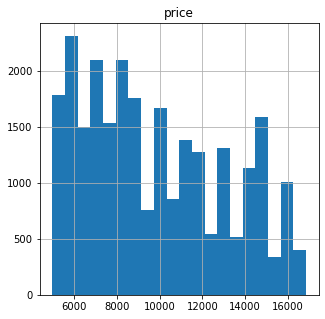

In [59]:

auto.hist('price', bins = 20 , range = (np.quantile(auto['price'], .25), np.quantile(auto['price'], .75)), figsize=(5,5))
print(auto['price'].describe())



price

count    49840.000000
mean     11077.234771
std       7782.032507
min          1.000000
25%       4995.000000
50%       8990.000000
75%      15900.000000
max      34499.000000
Name: price, dtype: float64



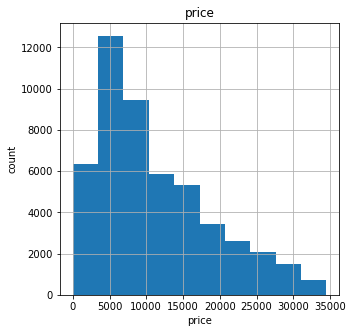

In [60]:
price_clean = auto[(auto['price']<34500)]
explore_raw(price_clean, 'price')

Without the outliers, we can see clear the distribution of the prices in our dataframe.

<hr>

### car_age

Finding outliers

In [61]:
out_check(auto,'car_age')

car_age

count    51525.000000
mean         8.507792
std          6.057327
min          0.000000
25%          4.000000
50%          8.000000
75%         12.000000
max         65.000000
Name: car_age, dtype: float64
number of null values: 0



min border: -8.0
max border: 24.0


In [62]:
find_borders(auto,'car_age')

min border: -8.0
max border: 24.0


In [63]:
auto.query('car_age > 24').sort_values(['car_age'], ascending = False).head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
14752,15000,1954,ford f-150,excellent,8,gas,3565.0,manual,pickup,black,0,2019-02-16,13,2019,2,sat,3,65,54.846154
10018,23900,1955,ford f250,excellent,6,gas,47180.0,manual,truck,blue,0,2018-12-22,61,2018,12,sat,3,63,748.888889
48414,37900,1958,chevrolet impala,good,8,gas,62799.0,automatic,coupe,undef,0,2018-08-11,10,2018,8,sat,2,60,1046.650000
39580,35000,1958,chevrolet impala,excellent,8,gas,3184.0,automatic,coupe,black,0,2018-05-19,33,2018,5,sat,3,60,53.066667
33007,17500,1960,chevrolet impala,excellent,8,gas,31000.0,automatic,sedan,white,0,2019-02-01,11,2019,2,fri,3,59,525.423729


In [64]:
car_age_outlier = len(auto.query('car_age > 24'))
car_age_outlier

736

In [65]:
car_age_outlier_rate = car_age_outlier/auto['car_age'].count()*100
car_age_outlier_rate

1.4284327996118389


car_age

count    50789.000000
mean         8.142511
std          5.163657
min          0.000000
25%          4.000000
50%          7.000000
75%         12.000000
max         24.000000
Name: car_age, dtype: float64



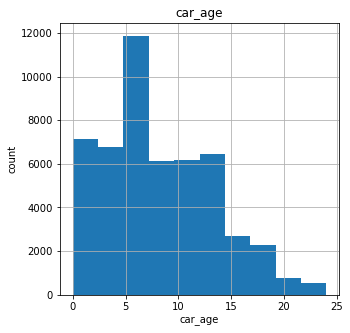

In [66]:
age_clean = auto[auto['car_age'] <= 24]
explore_raw(age_clean, 'car_age')

Without the outliers we have the cars with ages concentrated between 4 and 12 yars with a big numbers of car with an median around 7 years of age in the ads.

<hr>

### Odometer

Finding outliers

In [67]:
out_check(auto,'odometer')

odometer

count     51525.000000
mean     115197.921164
std       62082.648970
min           0.000000
25%       73500.000000
50%      114072.000000
75%      152862.000000
max      990000.000000
Name: odometer, dtype: float64
number of null values: 0



min border: -45543.0
max border: 271905.0


In [68]:
# checking the lower outliers
auto.query('odometer<5000').sort_values(['odometer'], ascending = True).tail()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
12053,21900,2016,nissan frontier crew cab sv,good,6,gas,4998.0,other,pickup,white,0,2019-03-17,61,2019,3,sun,2,3,1666.0
10506,21900,2016,nissan frontier crew cab sv,good,6,gas,4998.0,other,pickup,undef,0,2018-12-19,31,2018,12,wed,2,2,2499.0
26559,21900,2016,nissan frontier crew cab sv,good,6,gas,4998.0,other,pickup,white,0,2018-10-31,13,2018,10,wed,2,2,2499.0
10858,21900,2016,nissan frontier crew cab sv,good,6,gas,4998.0,other,pickup,white,0,2018-07-19,8,2018,7,thu,2,2,2499.0
11410,21900,2016,nissan frontier crew cab sv,good,6,gas,4998.0,other,pickup,white,0,2019-04-02,11,2019,4,tue,2,3,1666.0


In [69]:
#The cars with 0 mileage should be new, so let's check
auto[auto['odometer']==0]['condition'].value_counts()

good         104
excellent     69
fair           6
like new       4
salvage        2
Name: condition, dtype: int64

In [70]:
len(auto[auto['odometer']==0])

185

There are no "new" cars with zero mileage, so this sample is not correct and can affect the future calculations. So we can drop  the values with 0 miles, let's continue to check the low values

<hr>

In [71]:
#The cars with low mileage should be new, so let's check if they are from 2016 to 2019
auto[(auto['model_year'] >= 2016) & (auto['odometer']<1000 )].sort_values('odometer')

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
17037,45400,2018,ram 3500,excellent,6,diesel,0.0,automatic,pickup,black,1,2018-12-16,18,2018,12,sun,3,0,0.0
42352,9900,2017,chevrolet cruze,good,4,gas,0.0,automatic,sedan,blue,0,2018-05-03,34,2018,5,thu,2,1,0.0
42919,9900,2017,chevrolet cruze,good,4,gas,0.0,automatic,sedan,undef,0,2018-08-07,15,2018,8,tue,2,1,0.0
40362,9900,2017,hyundai elantra,good,4,gas,0.0,automatic,sedan,red,0,2018-11-13,62,2018,11,tue,2,1,0.0
40365,9900,2017,chevrolet cruze,good,4,gas,0.0,automatic,sedan,blue,0,2018-08-05,30,2018,8,sun,2,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10201,23800,2018,chevrolet camaro lt coupe 2d,good,6,gas,977.0,other,coupe,red,0,2019-03-18,2,2019,3,mon,2,1,977.0
43453,38997,2018,dodge charger,like new,8,gas,981.0,automatic,sedan,undef,0,2018-12-25,85,2018,12,tue,4,0,981.0
18924,12989,2018,honda civic,like new,4,gas,998.0,automatic,sedan,blue,0,2019-03-29,41,2019,3,fri,4,1,998.0
50742,12900,2018,honda civic,like new,4,gas,998.0,automatic,sedan,blue,0,2019-02-25,20,2019,2,mon,4,1,998.0


In [72]:
len(auto[(auto['model_year'] < 2016) & (auto['odometer']<1000 )])


719

In [73]:
#Just checking the value of all cars with less than 1000 miles
odom_outlier1 = len(auto[(auto['odometer']<1000 )])
#there is almost no difference between this value and the two others (car with zero mileage plus cars between 2016 and 2019 with less than 1000 miles)
odom_outlier1

838

Let's check the cars with high mileage

In [74]:
# checking the higher outliers
auto.query('odometer>273270').sort_values(['odometer'], ascending = True)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
2289,3500,2010,toyota prius,good,4,gas,273335.0,automatic,hatchback,red,0,2019-02-26,42,2019,2,tue,2,9,30370.555556
31655,9000,1998,toyota tacoma,good,6,gas,273500.0,manual,pickup,blue,1,2018-10-06,35,2018,10,sat,2,20,13675.000000
13005,8500,2004,ram 2500,good,6,diesel,273526.0,automatic,truck,undef,1,2018-06-02,22,2018,6,sat,2,14,19537.571429
49597,3500,2000,ford f-150,good,8,gas,273785.0,automatic,truck,black,1,2018-11-07,18,2018,11,wed,2,18,15210.277778
3225,5900,1995,ford f-250,good,8,diesel,274000.0,manual,truck,undef,1,2018-07-28,44,2018,7,sat,2,23,11913.043478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2840,18500,2014,ford explorer,excellent,6,gas,866000.0,automatic,SUV,black,1,2018-07-20,14,2018,7,fri,3,4,216500.000000
14245,6000,1996,ram 2500,good,10,gas,920000.0,automatic,truck,blue,0,2019-02-02,43,2019,2,sat,2,23,40000.000000
48962,40000,2014,ram 3500,excellent,6,diesel,980000.0,automatic,truck,white,1,2018-12-06,7,2018,12,thu,3,4,245000.000000
40729,4700,2013,chevrolet cruze,good,6,gas,990000.0,automatic,sedan,black,0,2018-05-02,4,2018,5,wed,2,5,198000.000000


In [75]:
odom_outlier2 = len(auto.query('odometer > 273270'))
odom_outlier = odom_outlier1 + odom_outlier2
odom_outlier

1456

In [76]:
odom_outlier_rate = odom_outlier*100/auto['odometer'].count()
odom_outlier_rate

2.8258127122755945


odometer

count     50069.000000
mean     114499.773592
std       55432.360735
min        1000.000000
25%       75400.000000
50%      114722.000000
75%      151754.000000
max      273237.000000
Name: odometer, dtype: float64



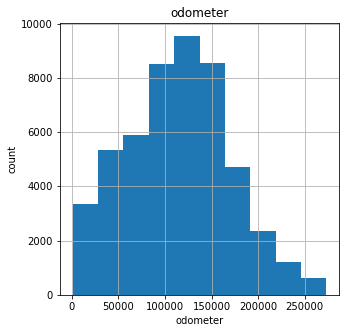

In [77]:
odometer_clean = auto[((auto['odometer']>=1000) & (auto['odometer'] <= 273270))]
explore_raw(odometer_clean, 'odometer')

The new data shows the cars with an average of 114.000 miles .

<hr>

### Cylinders

Finding outliers

In [78]:
out_check(auto, 'cylinders')

cylinders

count    51525.000000
mean         6.121494
std          1.657296
min          3.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         12.000000
Name: cylinders, dtype: float64
number of null values: 0



min border: -2.0
max border: 14.0


In [79]:
find_borders(auto,'cylinders')

min border: -2.0
max border: 14.0


In [80]:
auto.cylinders.value_counts()

8     17712
6     17457
4     15499
10      549
5       272
3        34
12        2
Name: cylinders, dtype: int64

Cylinders is like a category represented by numbers, but there is two categories that are irrelevant for our study. 12 cylinders (only two cars) and 3 cylinders (only 34 cars)

<hr>

In [81]:
cylinder_outlier = len(auto[(auto['cylinders']==3)| (auto['cylinders']==12)])
cylinder_outlier

36

In [82]:
cylinder_outlier_rate = cylinder_outlier/auto['cylinders'].count()*100
cylinder_outlier_rate

0.06986899563318777


cylinders

count    51489.000000
mean         6.123327
std          1.655528
min          4.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         10.000000
Name: cylinders, dtype: float64



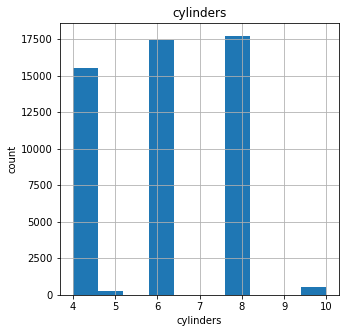

In [83]:
cylinders_clean = auto[(auto['cylinders']!=3)&(auto['cylinders']!=12)]
explore_raw(cylinders_clean , 'cylinders')

### condition_cat

Finding outliers

In [84]:
out_check(auto,'condition_cat' )


condition_cat

count    51525.000000
mean         2.637535
std          0.712447
min          0.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: condition_cat, dtype: float64
number of null values: 0



min border: 0.5
max border: 4.5


In [85]:
cond_cat_outlier = len(auto[(auto['condition_cat']==0)| (auto['condition_cat']==5)])
cond_cat_outlier

258

In [86]:
cond_cat_outlier_rate = cond_cat_outlier/auto['condition_cat'].count()*100
cond_cat_outlier_rate

0.5007278020378457


condition_cat

count    51267.000000
mean         2.636862
std          0.692071
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          4.000000
Name: condition_cat, dtype: float64



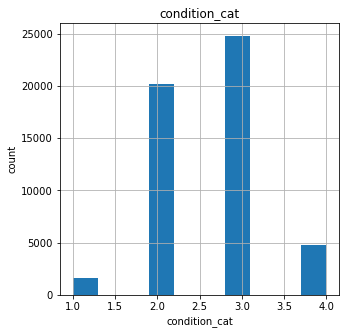

In [87]:
cond_cat_clean = auto[(auto['condition_cat']!=0)&(auto['condition_cat']!=5)]
explore_raw(cond_cat_clean , 'condition_cat')

To clean the condition, we took out the few numbers of new and salvage cars in our dataframe

<hr>

### Creating a new dataframe without the outliers 

merging the tables:  price_clean, age_clean, odometer_clean, cond_cat_clean 

In [88]:
auto_clean = auto [
    
    (auto['price']<34500)  &
    (auto['condition_cat']>0)& (auto['condition_cat']<5)&
    (auto['odometer']>=1000) & (auto['odometer'] <= 273270)&
    (auto['cylinders']!=3)&(auto['cylinders']!=12)&
    (auto['car_age'] <= 24)        
]

auto_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
price,47569.0,11251.412180,7805.003907,1.00,5000.000000,8995.0,15995.0,34499.0
model_year,47569.0,2010.062793,5.035798,1994.00,2007.000000,2011.0,2014.0,2019.0
cylinders,47569.0,6.065526,1.654217,4.00,4.000000,6.0,8.0,10.0
odometer,47569.0,116786.439236,54321.875147,1000.00,78285.500000,117835.0,153000.0,273237.0
is_4wd,47569.0,0.487839,0.499857,0.00,0.000000,0.0,1.0,1.0
days_listed,47569.0,39.558620,28.243912,0.00,19.000000,33.0,53.0,271.0
year,47569.0,2018.306565,0.461072,2018.00,2018.000000,2018.0,2019.0,2019.0
month,47569.0,6.636150,3.474047,1.00,3.000000,7.0,10.0,12.0
condition_cat,47569.0,2.633396,0.681364,1.00,2.000000,3.0,3.0,4.0
car_age,47569.0,8.243772,5.048573,0.00,4.000000,8.0,12.0,24.0


In [89]:
# Merging the tables
clean_list= [age_clean, odometer_clean, cond_cat_clean, cylinders_clean] 
auto_clean2 = price_clean
for t in clean_list:
    auto_clean2 = auto_clean.merge(t, how = 'left', copy = False)
len(auto_clean2)

47569

In [90]:
#rate of eliminated auto
del_data = len(auto)-len(auto_clean)
del_rate = del_data / len(auto)*100
print('Deleted Outliers:',del_data )
print('Rate of eliminates values:',del_rate)

Deleted Outliers: 3956
Rate of eliminates values: 7.677826297913634


<hr>


## Study core parameters without outliers

In [91]:
def comparing (new,old,column):
    Q1 = new[column].quantile(0.25)
    Q3 = new[column].quantile(0.75)
    IQR = Q3 - Q1
    max_iqr=Q3+1.5*IQR
    plt.hist([old[column], new[column]], range=(0,max_iqr) , bins = 30, alpha=0.8,)
    plt.xlabel(column)
    plt.ylabel("count")
    print(column)
    print("")
    print("")
    print("Old Values")
    print("")
    print(old[column].describe())
    print("")
    print("Filtered Values")
    print("")
    print(new[column].describe())
    print("")
    plt.show()
    print("")
    mean_new = new[column].mean()
    mean_old = old[column].mean()
    
    if mean_new > mean_old:
        print("The mean without outliers is higher than the original data")
    else:
        print("The mean without outliers is  lower than the original data")
    print("")
    print("*******************************************************************")
    print("")
   
    
               

price


Old Values

count     51525.000000
mean      12132.464920
std       10040.803015
min           1.000000
25%        5000.000000
50%        9000.000000
75%       16839.000000
max      375000.000000
Name: price, dtype: float64

Filtered Values

count    47569.000000
mean     11251.412180
std       7805.003907
min          1.000000
25%       5000.000000
50%       8995.000000
75%      15995.000000
max      34499.000000
Name: price, dtype: float64



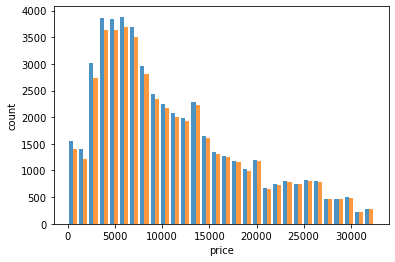


The mean without outliers is  lower than the original data

*******************************************************************

car_age


Old Values

count    51525.000000
mean         8.507792
std          6.057327
min          0.000000
25%          4.000000
50%          8.000000
75%         12.000000
max         65.000000
Name: car_age, dtype: float64

Filtered Values

count    47569.000000
mean         8.243772
std          5.048573
min          0.000000
25%          4.000000
50%          8.000000
75%         12.000000
max         24.000000
Name: car_age, dtype: float64



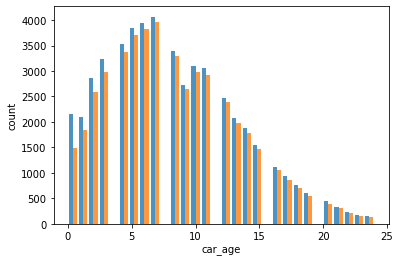


The mean without outliers is  lower than the original data

*******************************************************************

odometer


Old Values

count     51525.000000
mean     115197.921164
std       62082.648970
min           0.000000
25%       73500.000000
50%      114072.000000
75%      152862.000000
max      990000.000000
Name: odometer, dtype: float64

Filtered Values

count     47569.000000
mean     116786.439236
std       54321.875147
min        1000.000000
25%       78285.500000
50%      117835.000000
75%      153000.000000
max      273237.000000
Name: odometer, dtype: float64



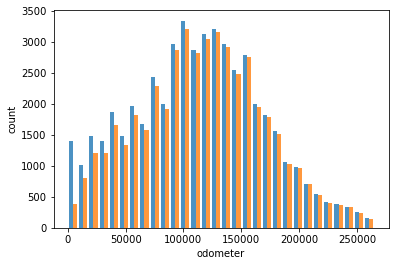


The mean without outliers is higher than the original data

*******************************************************************

cylinders


Old Values

count    51525.000000
mean         6.121494
std          1.657296
min          3.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         12.000000
Name: cylinders, dtype: float64

Filtered Values

count    47569.000000
mean         6.065526
std          1.654217
min          4.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         10.000000
Name: cylinders, dtype: float64



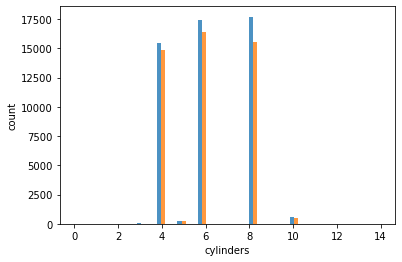


The mean without outliers is  lower than the original data

*******************************************************************

condition_cat


Old Values

count    51525.000000
mean         2.637535
std          0.712447
min          0.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: condition_cat, dtype: float64

Filtered Values

count    47569.000000
mean         2.633396
std          0.681364
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          4.000000
Name: condition_cat, dtype: float64



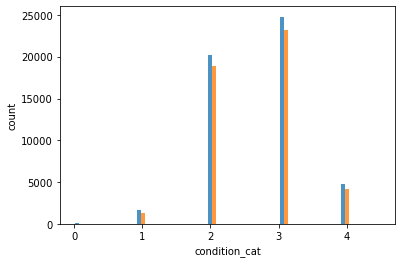


The mean without outliers is  lower than the original data

*******************************************************************



In [92]:
#Checking the new values for all modified columns

col_list=['price', 'car_age', 'odometer', 'cylinders', 'condition_cat']
for col in col_list:
    comparing(auto_clean, auto, col)


<hr>


## Ads lifetime

Let's find out how many days advertisements were displayed and if there are some abnormal vaues in this section


days_listed

count    47569.000000
mean        39.558620
std         28.243912
min          0.000000
25%         19.000000
50%         33.000000
75%         53.000000
max        271.000000
Name: days_listed, dtype: float64



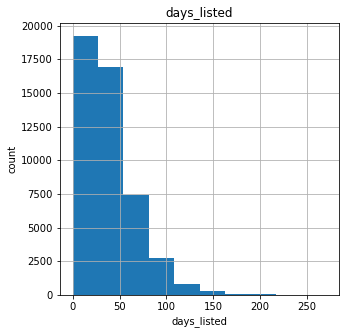

In [93]:
explore_raw(auto_clean, 'days_listed')


In [94]:
find_borders(auto_clean, 'days_listed')

min border: -32.0
max border: 104.0


In [95]:
len(auto_clean[auto_clean['days_listed']==0])

48

In [96]:
len(auto_clean[auto_clean['days_listed']<7])

2228

In [97]:
auto_clean[auto_clean['days_listed']==0].sort_values('date_posted').head(10)




,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
4901,12500,2001,ram 1500,good,8,gas,99892.0,automatic,truck,black,1,2018-05-11,0,2018,5,fri,2,17,5876.000000
1247,14995,2008,chevrolet silverado 1500,excellent,8,gas,93300.0,automatic,truck,grey,1,2018-05-15,0,2018,5,tue,3,10,9330.000000
39040,1900,2005,toyota prius,fair,4,gas,153108.0,automatic,hatchback,grey,0,2018-05-29,0,2018,5,tue,1,13,11777.538462
16046,8200,2014,honda accord,excellent,4,gas,121000.0,automatic,sedan,silver,0,2018-05-31,0,2018,5,thu,3,4,30250.000000
38822,17495,2018,chevrolet malibu,like new,4,gas,16505.0,automatic,sedan,white,0,2018-06-12,0,2018,6,tue,4,0,16505.000000
16612,11900,2008,ford f250 super duty,good,8,gas,120971.0,automatic,pickup,white,0,2018-06-18,0,2018,6,mon,2,10,12097.100000
17339,7800,2009,gmc sierra,excellent,6,gas,142000.0,automatic,truck,red,0,2018-07-05,0,2018,7,thu,3,9,15777.777778
10722,3100,2000,chevrolet silverado,good,8,gas,211000.0,automatic,truck,white,0,2018-07-06,0,2018,7,fri,2,18,11722.222222
4567,5000,2007,toyota corolla,good,4,gas,223000.0,manual,sedan,silver,0,2018-07-11,0,2018,7,wed,2,11,20272.727273
16210,13995,2008,toyota 4runner,excellent,6,gas,140000.0,automatic,SUV,undef,1,2018-07-17,0,2018,7,tue,3,10,14000.000000


In [98]:
len(auto_clean[auto_clean['days_listed']>104])

1491

In [99]:
out_check(auto_clean, 'days_listed')



days_listed

count    47569.000000
mean        39.558620
std         28.243912
min          0.000000
25%         19.000000
50%         33.000000
75%         53.000000
max        271.000000
Name: days_listed, dtype: float64
number of null values: 0



min border: -32.0
max border: 104.0


In [100]:
auto_clean[auto_clean['days_listed']>104].sample(5)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
49201,2995,2006,chevrolet impala,good,6,gas,193000.0,automatic,sedan,black,0,2018-09-02,107,2018,9,sun,2,12,16083.333333
1733,25545,2016,ford taurus,excellent,6,gas,53998.5,automatic,sedan,white,1,2019-04-07,106,2019,4,sun,3,3,17999.500000
45099,1,2017,ram 3500,excellent,10,gas,57482.0,other,truck,white,1,2018-09-24,112,2018,9,mon,3,1,57482.000000
43370,9000,2001,ford f-250 super duty,excellent,8,gas,179183.0,automatic,truck,undef,1,2019-03-19,123,2019,3,tue,3,18,9954.611111
38082,23900,2012,ford f-150,excellent,8,gas,71665.0,automatic,pickup,undef,1,2018-06-21,106,2018,6,thu,3,6,11944.166667


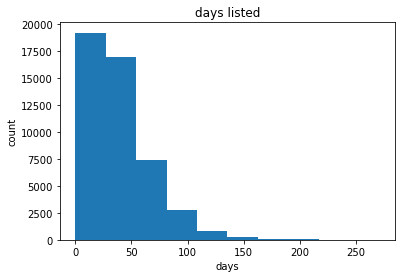

In [101]:

plt.hist(auto_clean['days_listed'])
plt.title('days listed')
plt.xlabel('days')
plt.ylabel('count')
plt.show()

### observations about the ad lifetime

 - The majority of the ads are staying in the website between 19 and 53 days
 - The lifetime of an car ad is in average around 33 and 39 days (median and mean).
 - There are ads that are staying less than a day (51 ads) and this is probably caused by errors in the publication.
 - There are some fast ads (less than a week) and slow ads (more than 104 days) 

- Checking the samples and the describe tables bellow for those trends, there is nothing indicating a special relation of a determinated carachteristic (as type, year or price of a car) so we can not infer nothing about it at this point.
 


<hr>

In [102]:
#long duration ads
auto_clean[auto_clean['days_listed']>104].describe().T

,count,mean,std,min,25%,50%,75%,max
price,1491.0,11089.663984,7684.226013,1.000,5332.000000,8995.000,15000.000000,34490.0
model_year,1491.0,2009.992622,4.932084,1994.000,2007.000000,2011.000,2014.000000,2019.0
cylinders,1491.0,6.097250,1.659809,4.000,4.000000,6.000,8.000000,10.0
odometer,1491.0,118040.573105,53507.622718,2414.000,79581.500000,120729.000,153108.000000,273237.0
is_4wd,1491.0,0.490275,0.500073,0.000,0.000000,0.000,1.000000,1.0
days_listed,1491.0,128.688799,24.710235,105.000,111.000000,121.000,138.000000,271.0
year,1491.0,2018.330651,0.470605,2018.000,2018.000000,2018.000,2019.000000,2019.0
month,1491.0,6.491616,3.511309,1.000,3.000000,7.000,10.000000,12.0
condition_cat,1491.0,2.639839,0.654152,1.000,2.000000,3.000,3.000000,4.0
car_age,1491.0,8.338028,4.937029,0.000,5.000000,8.000,11.000000,24.0


In [103]:
#short duration ads
auto_clean[auto_clean['days_listed']< 7].describe().T

,count,mean,std,min,25%,50%,75%,max
price,2228.0,11276.759425,7831.329777,1.000,5000.000000,8996.000,15986.000000,34379.0
model_year,2228.0,2010.073160,5.085222,1994.000,2007.000000,2011.000,2014.000000,2019.0
cylinders,2228.0,6.087074,1.663025,4.000,4.000000,6.000,8.000000,10.0
odometer,2228.0,116360.027828,54371.629144,1003.000,77356.250000,117751.000,153108.000000,272000.0
is_4wd,2228.0,0.476661,0.499567,0.000,0.000000,0.000,1.000000,1.0
days_listed,2228.0,4.030521,1.673900,0.000,3.000000,4.000,6.000000,6.0
year,2228.0,2018.293537,0.455484,2018.000,2018.000000,2018.000,2019.000000,2019.0
month,2228.0,6.732047,3.501814,1.000,4.000000,7.000,10.000000,12.0
condition_cat,2228.0,2.641382,0.691362,1.000,2.000000,3.000,3.000000,4.0
car_age,2228.0,8.220377,5.089094,0.000,4.000000,7.000,12.000000,24.0


<hr>


## Average price per each type of vehicle

### Average prices by type of car

<hr>

In [104]:
type_price = auto_clean.groupby(['type'])['price'].agg(['count','mean']).sort_values("count", ascending = False).reset_index()
type_price.head(10)

,type,count,mean
0,sedan,11704,6965.946514
1,SUV,11693,10447.653468
2,truck,10993,15157.890749
3,pickup,6247,15034.632304
4,coupe,1993,13501.035123
5,wagon,1468,9069.450954
6,mini-van,1130,8054.761947
7,hatchback,978,6848.764826
8,van,580,8825.541379
9,convertible,347,12741.037464


<hr>


## Top Car types
Finding the types with the most number of ads

In [105]:
fig = px.bar(type_price, x="count", y="type", color='type', orientation='h',
             
             height=450,
             title='Ads per Type of car')
fig.show()

In [106]:
type_top = type_price[type_price['count']> 11200]
type_top

,type,count,mean
0,sedan,11704,6965.946514
1,SUV,11693,10447.653468


In [107]:
fig = px.bar(type_top, x="count", y="type", color='type', orientation='h',
             
             height=300,
             title='Top Cars')
fig.show()

In [108]:
fig = px.scatter(type_top, x="count", y="mean", color='type', orientation='h',
             
             height=300,
             title='scatter_top type cars')
fig.show()


## Price factors influences

Let's check what factors impact the price most. We we conduct the study whether the price depends on age, mileage, condition, transmission type, and color with the two top types of car identified earlier. 

- In the categorical variables, the categories must have at least 50 ads; otherwise, their parameters won't be valid for analysis.

<hr>

In [109]:
#creating dtaframes for the top 2 types:
sedan_type = auto_clean[auto_clean['type']=='sedan']
suv_type = auto_clean[auto_clean['type']=='SUV']

<hr>

### Creating the sedan_clean data

In [110]:
sedan_type.sample()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
18309,5900,2009,honda accord,good,4,gas,133245.0,automatic,sedan,black,0,2018-11-30,11,2018,11,fri,2,9,14805.0


In [111]:
sedan_type['transmission'].value_counts()

automatic    11011
manual         566
other          127
Name: transmission, dtype: int64

In [112]:
sedan_type['paint_color'].value_counts()

undef     2112
silver    1989
black     1704
grey      1561
white     1451
blue      1192
red        902
custom     288
brown      253
green      198
purple      24
yellow      21
orange       9
Name: paint_color, dtype: int64

In [113]:
sedan_type['condition'].value_counts()

excellent    5974
good         4187
like new     1275
fair          268
Name: condition, dtype: int64

In [114]:

sedan_clean = sedan_type[    
    (sedan_type['paint_color']!='purple') &
    (sedan_type['paint_color']!= 'yellow')&
    (sedan_type['paint_color']!= 'orange')& 
    (sedan_type['paint_color']!= 'undef')
]

sedan_clean.reset_index()
                         

,index,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
0,2,5500,2013,hyundai sonata,like new,4,gas,110000.0,automatic,sedan,red,0,2019-02-07,79,2019,2,thu,4,6,18333.333333
1,4,14900,2017,chrysler 200,excellent,4,gas,80903.0,automatic,sedan,black,0,2019-04-02,28,2019,4,tue,3,2,40451.500000
2,5,14990,2014,chrysler 300,excellent,6,gas,57954.0,automatic,sedan,black,1,2018-06-20,15,2018,6,wed,3,4,14488.500000
3,6,12990,2015,toyota camry,excellent,4,gas,79212.0,automatic,sedan,white,0,2018-12-27,73,2018,12,thu,3,3,26404.000000
4,11,8990,2012,honda accord,excellent,4,gas,111142.0,automatic,sedan,grey,0,2019-03-28,29,2019,3,thu,3,7,15877.428571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9533,51517,11000,2012,dodge charger,excellent,8,gas,81000.0,automatic,sedan,black,0,2019-04-19,44,2019,4,fri,3,7,11571.428571
9534,51518,3750,2005,ford taurus,excellent,6,gas,110200.0,automatic,sedan,silver,0,2018-08-10,63,2018,8,fri,3,13,8476.923077
9535,51520,9249,2013,nissan maxima,like new,6,gas,88136.0,automatic,sedan,black,0,2018-10-03,37,2018,10,wed,4,5,17627.200000
9536,51522,3950,2009,hyundai sonata,excellent,4,gas,128000.0,automatic,sedan,blue,0,2018-11-15,32,2018,11,thu,3,9,14222.222222


#### Checking the values again

In [115]:
sedan_clean['paint_color'].value_counts()

silver    1989
black     1704
grey      1561
white     1451
blue      1192
red        902
custom     288
brown      253
green      198
Name: paint_color, dtype: int64

In [116]:
sedan_clean['condition'].value_counts()

excellent    4866
good         3438
like new     1021
fair          213
Name: condition, dtype: int64

In [117]:
sedan_clean['transmission'].value_counts()

automatic    8976
manual        459
other         103
Name: transmission, dtype: int64

<hr>

### Creating the suv_clean data

In [118]:
suv_type['transmission'].value_counts()

automatic    11077
manual         459
other          157
Name: transmission, dtype: int64

In [119]:
suv_type['paint_color'].value_counts()

undef     2097
black     2059
white     1840
silver    1509
grey      1132
blue       988
red        863
green      404
brown      348
custom     291
orange      80
yellow      43
purple      39
Name: paint_color, dtype: int64

In [120]:
suv_type['condition'].value_counts()

excellent    6228
good         4126
like new     1053
fair          286
Name: condition, dtype: int64

In [121]:
suv_clean = suv_type[
    (suv_type['paint_color']!='purple') &
    (suv_type['paint_color']!= 'yellow')&
    (suv_type['paint_color']!= 'undef')
]
suv_clean.reset_index()
                         

,index,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
0,7,15990,2013,honda pilot,excellent,6,gas,109473.0,automatic,SUV,black,1,2019-01-07,68,2019,1,mon,3,6,18245.500000
1,9,9200,2008,honda pilot,excellent,6,gas,147191.0,automatic,SUV,blue,1,2019-02-15,17,2019,2,fri,3,11,13381.000000
2,14,12990,2009,gmc yukon,excellent,8,gas,132285.0,automatic,SUV,black,1,2019-01-31,24,2019,1,thu,3,10,13228.500000
3,17,13990,2014,jeep cherokee,excellent,6,gas,100669.0,automatic,SUV,red,1,2018-08-16,25,2018,8,thu,3,4,25167.250000
4,18,12500,2013,chevrolet traverse,excellent,6,gas,128325.0,automatic,SUV,white,1,2019-04-09,13,2019,4,tue,3,6,21387.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9509,51480,6999,2011,gmc acadia,excellent,6,gas,180935.0,automatic,SUV,grey,0,2018-06-10,41,2018,6,sun,3,7,25847.857143
9510,51483,6499,2011,chevrolet traverse,excellent,6,gas,155903.0,automatic,SUV,grey,0,2018-08-18,34,2018,8,sat,3,7,22271.857143
9511,51494,7999,2009,chevrolet equinox,excellent,6,gas,95021.0,automatic,SUV,silver,1,2019-01-03,8,2019,1,thu,3,10,9502.100000
9512,51500,6995,2012,buick enclave,excellent,6,gas,157000.0,automatic,SUV,white,1,2018-08-04,17,2018,8,sat,3,6,26166.666667


#### Checking the values again

In [122]:
suv_clean['paint_color'].value_counts()

black     2059
white     1840
silver    1509
grey      1132
blue       988
red        863
green      404
brown      348
custom     291
orange      80
Name: paint_color, dtype: int64

In [123]:
suv_clean['transmission'].value_counts()

automatic    9023
manual        360
other         131
Name: transmission, dtype: int64

In [124]:
suv_clean['condition'].value_counts()

excellent    5108
good         3318
like new      857
fair          231
Name: condition, dtype: int64

In [125]:
sedan_clean2 = sedan_type[~(sedan_type['paint_color'].isin(['purple' , 'yellow', 'orange' , 'undef']))]

In [126]:
sedan_clean2.head()

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed,year,month,weekday,condition_cat,car_age,miles_year
2,5500,2013,hyundai sonata,like new,4,gas,110000.0,automatic,sedan,red,0,2019-02-07,79,2019,2,thu,4,6,18333.333333
4,14900,2017,chrysler 200,excellent,4,gas,80903.0,automatic,sedan,black,0,2019-04-02,28,2019,4,tue,3,2,40451.500000
5,14990,2014,chrysler 300,excellent,6,gas,57954.0,automatic,sedan,black,1,2018-06-20,15,2018,6,wed,3,4,14488.500000
6,12990,2015,toyota camry,excellent,4,gas,79212.0,automatic,sedan,white,0,2018-12-27,73,2018,12,thu,3,3,26404.000000
11,8990,2012,honda accord,excellent,4,gas,111142.0,automatic,sedan,grey,0,2019-03-28,29,2019,3,thu,3,7,15877.428571


### Price X Paint color (Sedan)

In [127]:

fig = px.box(sedan_clean, x='paint_color', y='price', color = 'paint_color', points=False, width=700, height=500,
            color_discrete_sequence=["red", "black", "white", "grey", "silver", 'purple', 'blue', 'green','brown'],
             title="Sedan Price X Paint color")
fig.show()

The most expensive sedans are the black and the white ones and the cheapers are cars of the color brown and green

<hr>

### Price X Transmission (Sedan)

In [128]:

fig = px.box(sedan_clean, x='transmission', y='price', color = 'transmission', points=False, width=700, height=500,
            title="Sedan Price X Transmission")
fig.show()

 Aparently the other and automatic transmission have close medians, but the other seems to have more expensive cars in general .Maybe this difference can be caused by the low number of samples  - only 54 - or because this type of transmission are not standard and so are more expensive to have it in the car.

<hr>

### Price X Condition (Sedan)
The condition is more accurate to be analized as a categorical item, then a quantitative, because the numbers are not related to some of measurable carachteristic of the car as mileage or age.

In [129]:

fig = px.box(sedan_clean, x='condition', y='price', color = 'condition', points=False, width=700, height=500,
            title="Sedan Price X Condition")
fig.show()

In [130]:

fig = px.scatter(sedan_clean, x='condition_cat', y='price', color = 'condition',  width=700, height=500,
            title="Sedan Price X Condition")
fig.show()

For the Sedans the condition is showed as totally correlated with the price. The better the condition, higher is the price and the worse the condition, lower the price.

<hr>

### Price X Paint color (SUV)

In [131]:

fig = px.box(suv_clean, x='paint_color', y='price', color = 'paint_color', points=False, width=700, height=500,
            color_discrete_sequence=["black", "blue", "red", "white", "silver", 'grey', 'green', 'brown','orange', 'purple'],
             title="SUV Price X Paint color")
fig.show()

The black SUVs appeared to be the the most expensives followed by the white ones. On the tail we can find the brown, the blue and confirming the tendency of the Sedan, the green SUVs are the cheapers in the market

Our data is showing a high prices value of the orange color, but this is refering to a short sample of cars (only 79) it can say that this color is hard to find and therefore more expensive, or most probably only a distortion from our small sample.


<hr>

### Price X Transmission (SUV)

In [132]:

fig = px.box(suv_clean, x='transmission', y='price', color = 'transmission', points=False, width=700, height=500,
            title="SUV Price X Transmission")
fig.show()

The other type of transmission in the SUV cars appears again as pulling the prices of the cars up, but the order of the two remaining types have the ordr switched here in comparisson with the Sedan cars.
The manual SUVs are more expensive than the automatic ones.

<hr>

### Price X Condition (SUV)

In [133]:

fig = px.box(suv_clean, x='condition', y='price', color = 'condition', points=False, width=700, height=500,
            title="SUV Price X Transmission")
fig.show()

Again the graph shows a direct relation between the price and the condition of the car also for the SUVs

In [134]:
# Let's create a function to create scatterplots of the non-categorical values with the price

def scatter_price(df,column):
    print("")
    
    plt.scatter(df[column], df['price'], alpha=0.4)
    plt.xlabel(column)
    plt.ylabel("price")
    plt.title(column + ' X price')
    plt.show()
    
    print("")
   


<hr>

### Sedan's non-categorical columns scatter plots

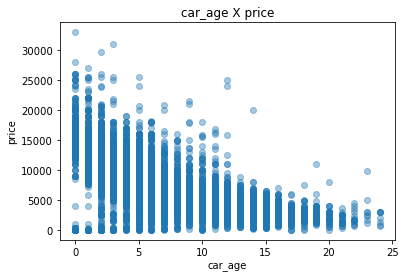

In [135]:
scatter_price(sedan_clean, 'car_age')

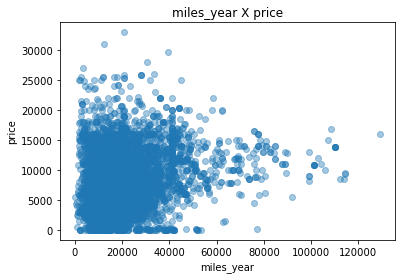

In [136]:
scatter_price(sedan_clean, 'miles_year')

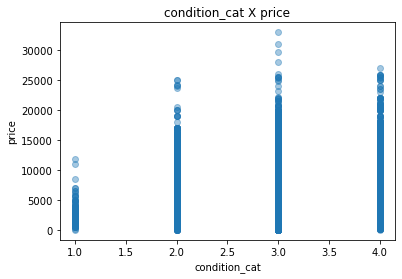

In [137]:
scatter_price(sedan_clean, 'condition_cat')

### Matrix and Correlations (Sedan)

In [138]:
list_sedan= sedan_clean[['price', 'car_age','odometer', 'miles_year']]
list_sedan

,price,car_age,odometer,miles_year
2,5500,6,110000.0,18333.333333
4,14900,2,80903.0,40451.500000
5,14990,4,57954.0,14488.500000
6,12990,3,79212.0,26404.000000
11,8990,7,111142.0,15877.428571
...,...,...,...,...
51517,11000,7,81000.0,11571.428571
51518,3750,13,110200.0,8476.923077
51520,9249,5,88136.0,17627.200000
51522,3950,9,128000.0,14222.222222


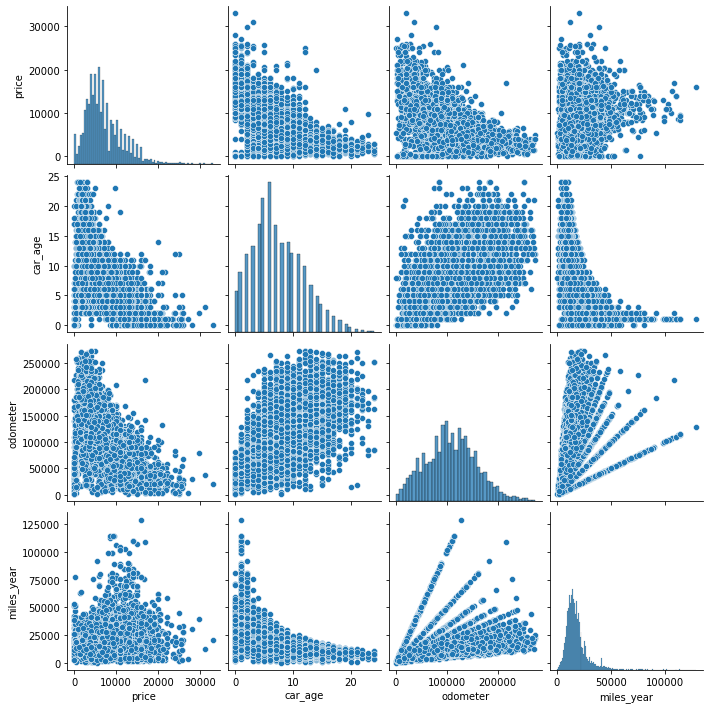

In [139]:
sns.pairplot(list_sedan)

In [140]:
list_sedan.corr()

,price,car_age,odometer,miles_year
price,1.000000,-0.621294,-0.602606,0.279882
car_age,-0.621294,1.000000,0.656170,-0.545106
odometer,-0.602606,0.656170,1.000000,-0.021403
miles_year,0.279882,-0.545106,-0.021403,1.000000


Our Sedan's Data is showing a strong inverse correlation between the price and the age ore the total mileage of the car.
If the car is older, the price tend to be lower, and if the car have more milleage, also the price tend to be lower.


There is some discrepance when analizing the price against the miles_year, that is showing a weak correlation. The question is not with the price itself, but it is more by the creation of this variable. When we divided the mileage by the age of the car, we are expecting to see the two of them to have some type of linear relation (the older the car, more mileage it will have). Unnexpectedly our data showed that newer cars can have more mileage than old ones and vice versa, creating a dispersion of the values of mileage_year that are showing this weak correlation with the odometer values.

### SUV's non-categorical columns scatter plots

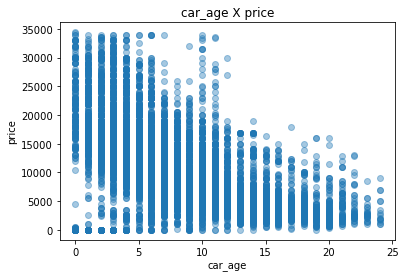

In [141]:
scatter_price(suv_clean, 'car_age')

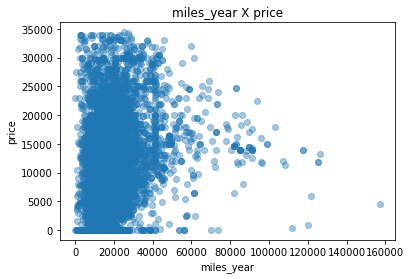

In [142]:
scatter_price(suv_clean, 'miles_year')

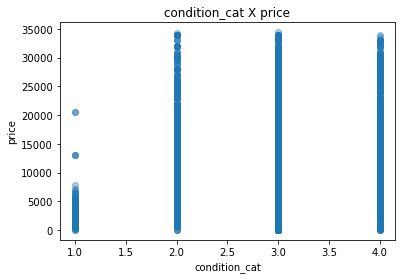

In [143]:
scatter_price(suv_clean, 'condition_cat')

### Matrix and Correlations (SUV)

In [144]:
list_suv= suv_clean[['price', 'car_age','odometer', 'miles_year']]
list_suv

,price,car_age,odometer,miles_year
7,15990,6,109473.0,18245.500000
9,9200,11,147191.0,13381.000000
14,12990,10,132285.0,13228.500000
17,13990,4,100669.0,25167.250000
18,12500,6,128325.0,21387.500000
...,...,...,...,...
51480,6999,7,180935.0,25847.857143
51483,6499,7,155903.0,22271.857143
51494,7999,10,95021.0,9502.100000
51500,6995,6,157000.0,26166.666667


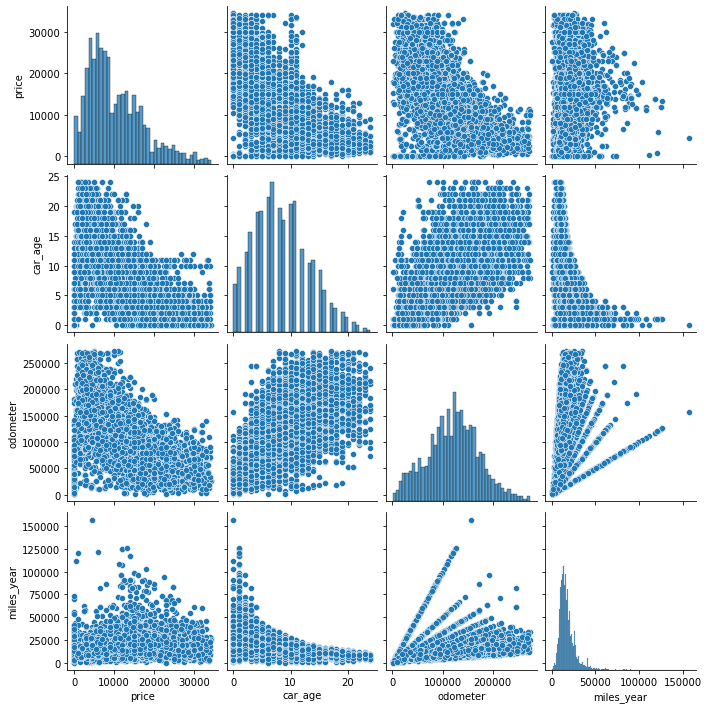

In [145]:
sns.pairplot(list_suv)

In [146]:
list_suv.corr()

,price,car_age,odometer,miles_year
price,1.000000,-0.579797,-0.563508,0.263232
car_age,-0.579797,1.000000,0.678433,-0.560052
odometer,-0.563508,0.678433,1.000000,-0.076558
miles_year,0.263232,-0.560052,-0.076558,1.000000


The SUV's Data is confirming a strong inverse correlation between the price and the age ore the total mileage of the car.
If the car is older, the price tend to be lower, and if the car have more milleage, also the price tend to be lower.
Also the miles_year showed the same issue explained before

<hr>


# General conclusions


## Introduction
- The data received had lot of missing values and unformated data, that we had to work to get a better view of the price behavior in this ad website.
- It's interesting to highlight that the lifetime of an ad on the website is around a month to close a deal (or to the ad being excluded), but also there is some ads ranging from a few days and to a few months.
- There were also a lot of semi duplicated car ads with all car specifications the same, but with different dates of posting. This can be a big coincidence, but maybe this is sign of a user behavior or technical issue that should be important to address in the future 

## what factors influence a price in a car?
Analizing our samples of the top two car traded in the platform (Sedan and SUV) we were able to determine some trends about what factors influence on the price of a car.

* The condition of a car seems to be one of the most important factors at the time to define the prices. We find a positive correlation, indicating that the better is the condition, the bigger should be the price.
* The age and de mileage are having a great influence too, but in an inversed way. The older the car is, the cheaper it tends to be. Also the bigger the mileage, the smaller seems to be the price.
* One unexpected factor was the influence of the color on the price of the vehicles. The sample showed that the black and white are the more expensive cars while the brown and green tend to push the prices down.

All these are initial conclusions, that we can study more deeply those trends if Crankshaft List is interested to find out more specific connections between these factors and the ads posted in its site



<hr>